In [1]:
%cd ../

/home/zulqarnain/develop/htfatorch


In [2]:
import logging
import numpy as np
import re

import htfa_torch.dtfa as DTFA
import htfa_torch.niidb as niidb
import htfa_torch.utils as utils

/home/zulqarnain/.conda/envs/htfatorch/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [3]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [4]:
logging.basicConfig(format='%(asctime)s %(message)s', datefmt='%m/%d/%Y %H:%M:%S',
                    level=logging.INFO)

In [5]:
lepping_db = niidb.FMriActivationsDb('data/sound_depression.db', mask='/media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/mask/sound_depression_mask_MNI152.nii.gz')

In [6]:
dtfa = DTFA.DeepTFA([b for b in lepping_db.all() if 'response' not in b.task and 'tones' not in b.task],
                    mask='/media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/mask/sound_depression_mask_MNI152.nii.gz',num_factors=100, embedding_dim=2)

01/30/2020 10:19:32 Loading Nifti image /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/nifti_files/sub-control01_run3_music_mc_MNI_masked.nii.gz with mask /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/mask/sound_depression_mask_MNI152.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/30/2020 10:19:35 Loading Nifti image /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/nifti_files/sub-control01_run2_music_mc_MNI_masked.nii.gz with mask /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/mask/sound_depression_mask_MNI152.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/30/2020 10:19:38 Loading Nifti image /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/nifti_files/sub-control01_run4_nonmusic_mc_MNI_masked.nii.gz with mask /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Fin

01/30/2020 10:20:30 Loading Nifti image /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/nifti_files/sub-control06_run4_music_mc_MNI_masked.nii.gz with mask /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/mask/sound_depression_mask_MNI152.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/30/2020 10:20:32 Loading Nifti image /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/nifti_files/sub-control07_run3_music_mc_MNI_masked.nii.gz with mask /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/mask/sound_depression_mask_MNI152.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/30/2020 10:20:35 Loading Nifti image /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/nifti_files/sub-control07_run2_music_mc_MNI_masked.nii.gz with mask /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/

01/30/2020 10:21:25 Loading Nifti image /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/nifti_files/sub-control12_run5_music_mc_MNI_masked.nii.gz with mask /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/mask/sound_depression_mask_MNI152.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/30/2020 10:21:28 Loading Nifti image /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/nifti_files/sub-control12_run4_music_mc_MNI_masked.nii.gz with mask /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/mask/sound_depression_mask_MNI152.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/30/2020 10:21:30 Loading Nifti image /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/nifti_files/sub-control13_run3_music_mc_MNI_masked.nii.gz with mask /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/

01/30/2020 10:22:22 Loading Nifti image /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/nifti_files/sub-control18_run2_music_mc_MNI_masked.nii.gz with mask /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/mask/sound_depression_mask_MNI152.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/30/2020 10:22:24 Loading Nifti image /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/nifti_files/sub-control18_run4_nonmusic_mc_MNI_masked.nii.gz with mask /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/mask/sound_depression_mask_MNI152.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/30/2020 10:22:27 Loading Nifti image /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/nifti_files/sub-control18_run5_nonmusic_mc_MNI_masked.nii.gz with mask /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_

01/30/2020 10:23:19 Loading Nifti image /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/nifti_files/sub-mdd04_run1_nonmusic_mc_MNI_masked.nii.gz with mask /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/mask/sound_depression_mask_MNI152.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/30/2020 10:23:21 Loading Nifti image /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/nifti_files/sub-mdd04_run2_nonmusic_mc_MNI_masked.nii.gz with mask /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/mask/sound_depression_mask_MNI152.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/30/2020 10:23:24 Loading Nifti image /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/nifti_files/sub-mdd04_run5_music_mc_MNI_masked.nii.gz with mask /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/mask/s

01/30/2020 10:24:15 Loading Nifti image /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/nifti_files/sub-mdd10_run3_music_mc_MNI_masked.nii.gz with mask /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/mask/sound_depression_mask_MNI152.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/30/2020 10:24:18 Loading Nifti image /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/nifti_files/sub-mdd10_run2_music_mc_MNI_masked.nii.gz with mask /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/mask/sound_depression_mask_MNI152.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/30/2020 10:24:20 Loading Nifti image /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/nifti_files/sub-mdd10_run4_nonmusic_mc_MNI_masked.nii.gz with mask /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/mask/soun

01/30/2020 10:25:12 Loading Nifti image /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/nifti_files/sub-mdd15_run5_nonmusic_mc_MNI_masked.nii.gz with mask /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/mask/sound_depression_mask_MNI152.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/30/2020 10:25:15 Loading Nifti image /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/nifti_files/sub-mdd16_run1_nonmusic_mc_MNI_masked.nii.gz with mask /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/mask/sound_depression_mask_MNI152.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/30/2020 10:25:18 Loading Nifti image /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/nifti_files/sub-mdd16_run2_nonmusic_mc_MNI_masked.nii.gz with mask /media/babak/74e696ad-c235-46fc-a6e7-1830e44c8a1b/zulqarnain/Sound_Depression_Final/mas

In [7]:
dtfa.num_parameters()

1278212

In [8]:
dtfa.load_state('data/lepping_noresponse_restz_k100_n1000_01302020_042320')

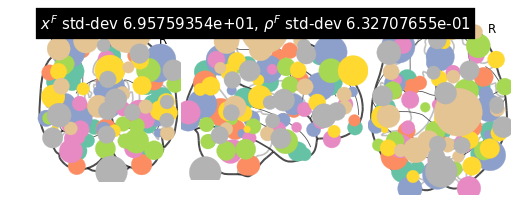

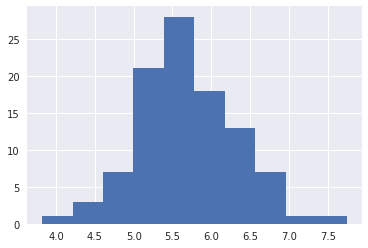

(<nilearn.plotting.displays.OrthoProjector at 0x7f6ebc1fcef0>,
 tensor([[ -21.5528,  -83.1037,  -32.6480],
         [  46.1465,    1.5085,    6.6698],
         [ -54.9713,  -20.0642,   29.2334],
         [   6.4376,  -42.4586,   47.5813],
         [ -14.6982,   70.3801,  -18.3420],
         [  55.9456,  -45.6127,   12.0497],
         [   3.8621,   33.2465,   56.8617],
         [ -37.3268,  -86.8973,   40.3022],
         [ -32.6112,    9.8934,  -43.4671],
         [  42.5600,  -68.5098,  -16.5840],
         [  37.6600,   17.3907,  -46.5621],
         [  40.6088,   45.1391,   24.3205],
         [ -38.0819,   48.0647,   28.8297],
         [  -2.3647,  -55.6574,  -20.4156],
         [  47.8062,   12.2030,   30.5047],
         [  -0.3819,  -87.2075,   28.8829],
         [ -33.2004,  -44.6784,  -59.3759],
         [ -44.1935,   -4.9771,   -9.1968],
         [ -61.8333,  -36.2921,   38.8145],
         [  24.1590,   69.7210,  -10.7950],
         [  35.0348,  -40.4606,  -57.9176],
         [ -4

In [9]:
dtfa.visualize_factor_embedding()

In [10]:
def subject_labeler(subject):
    subject_regex = re.compile("([A-Za-z]+)([0-9]{1,2})")
    m = subject_regex.search(subject)
    condition, sub_num = m.groups()
    if condition == 'mdd':
        condition = 'Major Depressive'
    elif condition == 'control':
        condition = 'Control'
    return '%s Participant %d' % (condition, int(sub_num))

In [11]:
def task_labeler(task):
    if task == 'negative_music':
        task = 'Negative music'
    elif task == 'positive_music':
        task = 'Positive music'
    elif task == 'negative_nonmusic':
        task = 'Negative sounds'
    elif task == 'positive_nonmusic':
        task = 'Positive sounds'
    else:
        task = task.capitalize()
    return task

In [12]:
def lepping_2017_labeler(block):
    task = task_labeler(block.task)
    return task + ' stimulus'

In [13]:
validation_filter = lepping_db.inference_filter(training=False)
validation_blocks = [b for (b, block) in enumerate(dtfa._blocks) if validation_filter(block)]

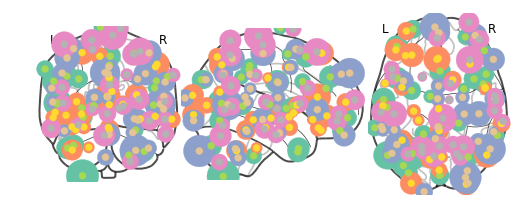

/home/zulqarnain/.conda/envs/htfatorch/lib/python3.6/site-packages/numpy/ma/core.py:3174: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  dout = self.data[indx]
/home/zulqarnain/.conda/envs/htfatorch/lib/python3.6/site-packages/numpy/ma/core.py:3206: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  mout = _mask[indx]


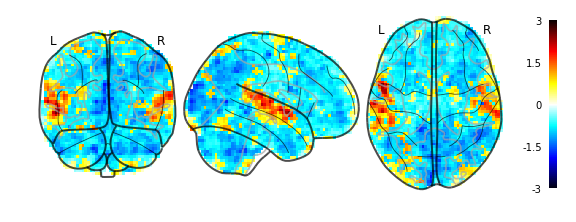

01/30/2020 10:27:40 Reconstruction Error (Frobenius Norm): 8.00857010e+01 out of 7.67137085e+02


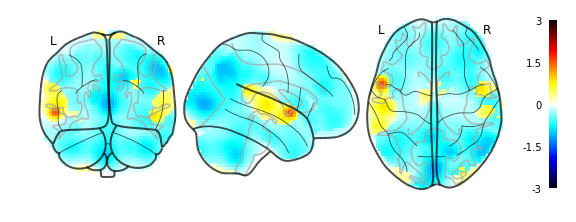

01/30/2020 10:27:42 Reconstruction Error (Frobenius Norm): 8.00857010e+01 out of 7.67137085e+02


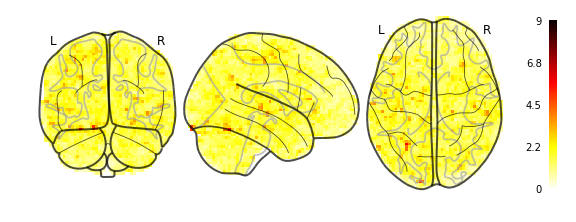

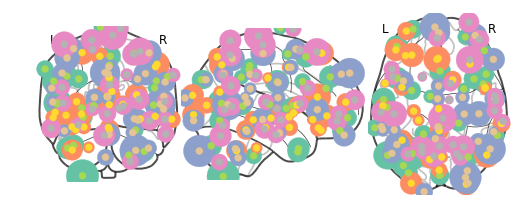

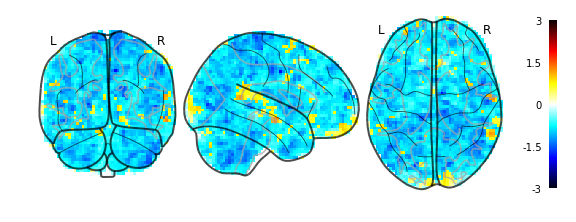

01/30/2020 10:27:48 Reconstruction Error (Frobenius Norm): 7.69422913e+01 out of 9.58201843e+02


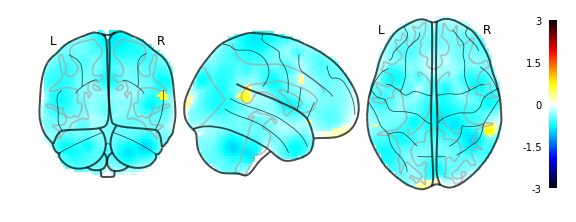

01/30/2020 10:27:51 Reconstruction Error (Frobenius Norm): 7.69422913e+01 out of 9.58201843e+02


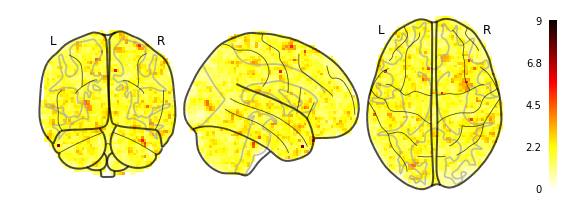

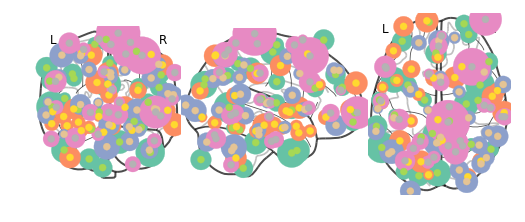

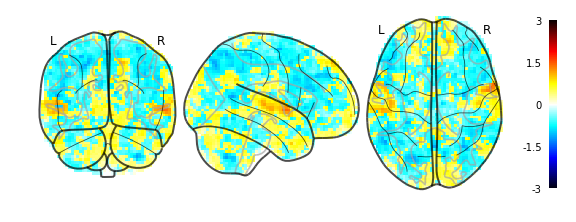

01/30/2020 10:27:57 Reconstruction Error (Frobenius Norm): 6.20629463e+01 out of 7.88558411e+02


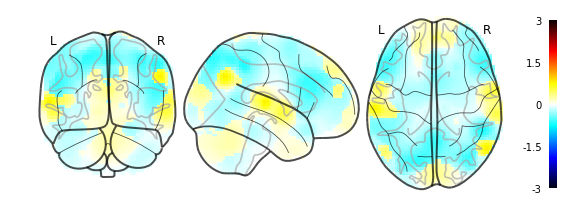

01/30/2020 10:27:59 Reconstruction Error (Frobenius Norm): 6.20629463e+01 out of 7.88558411e+02


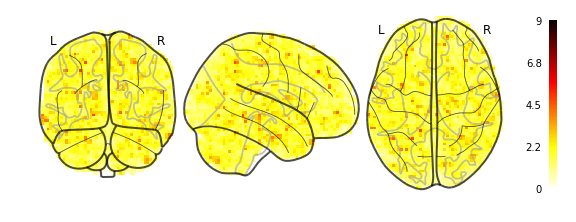

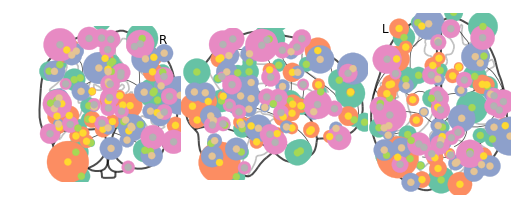

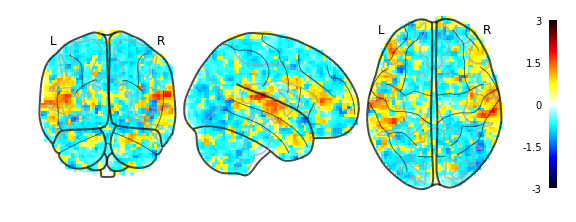

01/30/2020 10:28:05 Reconstruction Error (Frobenius Norm): 7.40748901e+01 out of 8.18825989e+02


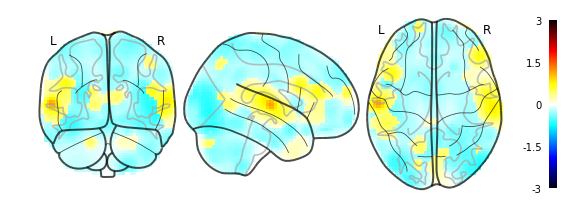

01/30/2020 10:28:08 Reconstruction Error (Frobenius Norm): 7.40748901e+01 out of 8.18825989e+02


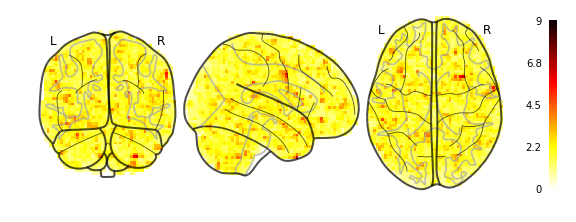

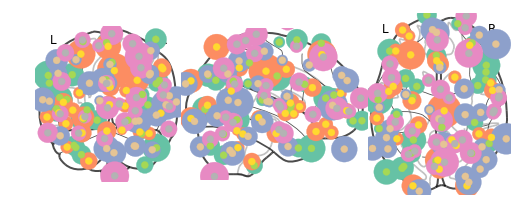

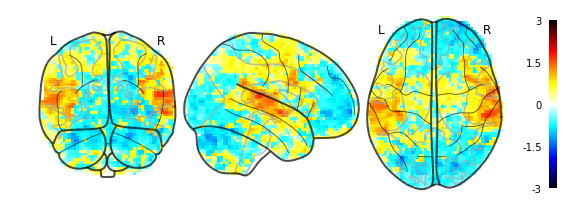

01/30/2020 10:28:14 Reconstruction Error (Frobenius Norm): 6.59980392e+01 out of 8.02983398e+02


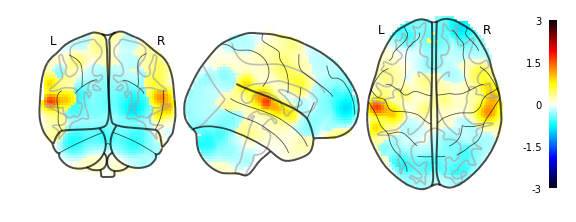

01/30/2020 10:28:16 Reconstruction Error (Frobenius Norm): 6.59980392e+01 out of 8.02983398e+02


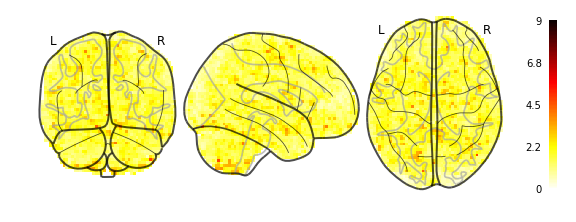

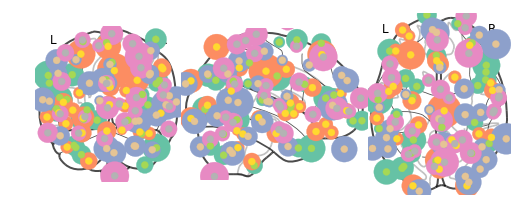

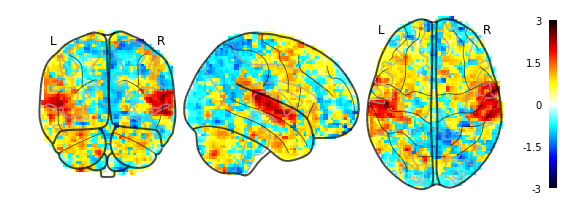

01/30/2020 10:28:22 Reconstruction Error (Frobenius Norm): 8.87796555e+01 out of 9.82731445e+02


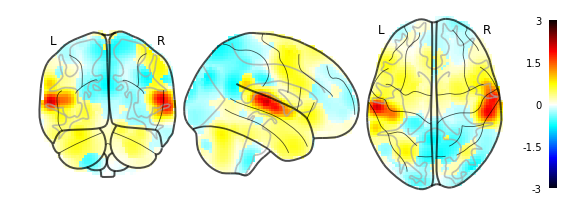

01/30/2020 10:28:24 Reconstruction Error (Frobenius Norm): 8.87796555e+01 out of 9.82731445e+02


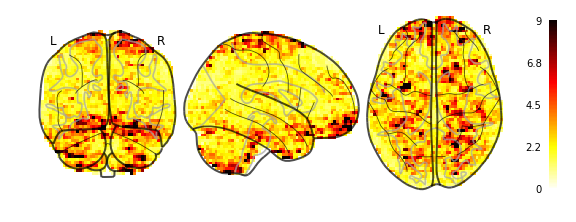

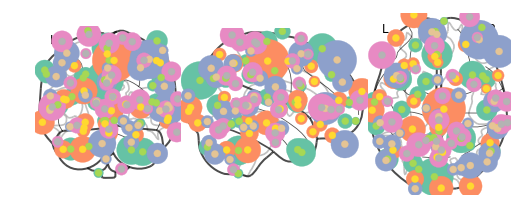

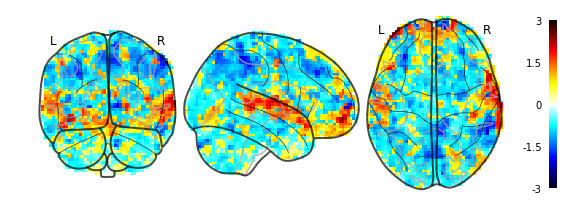

01/30/2020 10:28:30 Reconstruction Error (Frobenius Norm): 9.12415237e+01 out of 7.78388306e+02


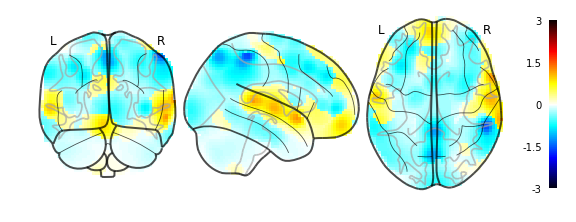

01/30/2020 10:28:32 Reconstruction Error (Frobenius Norm): 9.12415237e+01 out of 7.78388306e+02


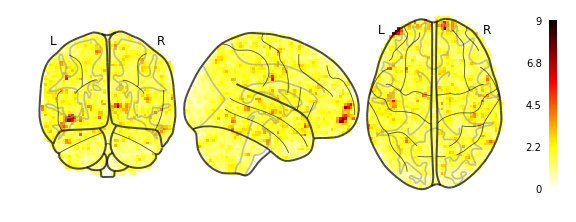

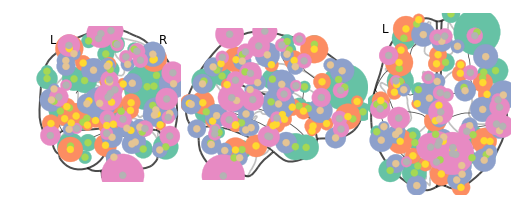

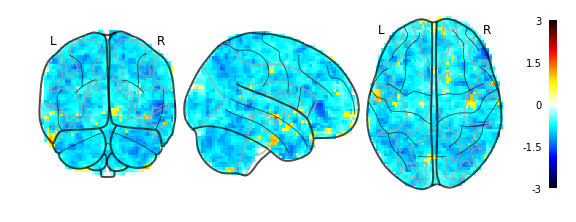

01/30/2020 10:28:38 Reconstruction Error (Frobenius Norm): 6.91372452e+01 out of 8.25541382e+02


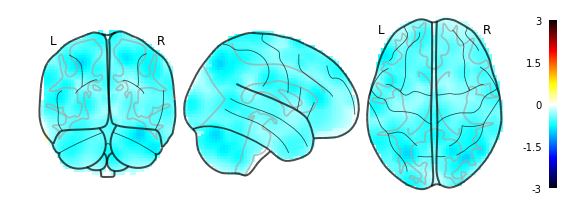

01/30/2020 10:28:40 Reconstruction Error (Frobenius Norm): 6.91372452e+01 out of 8.25541382e+02


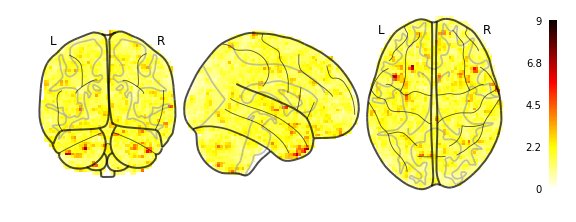

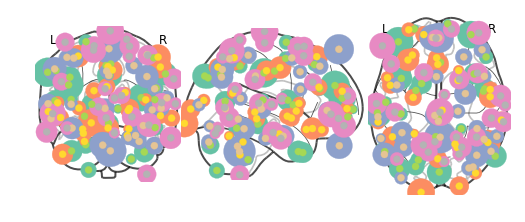

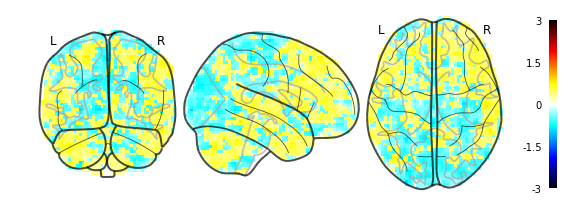

01/30/2020 10:28:46 Reconstruction Error (Frobenius Norm): 4.96006317e+01 out of 7.60057556e+02


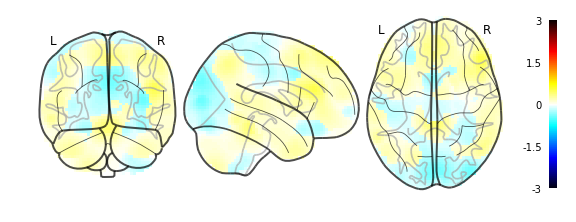

01/30/2020 10:28:49 Reconstruction Error (Frobenius Norm): 4.96006317e+01 out of 7.60057556e+02


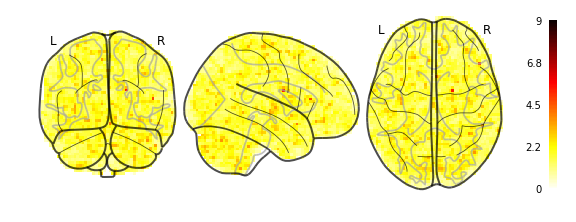

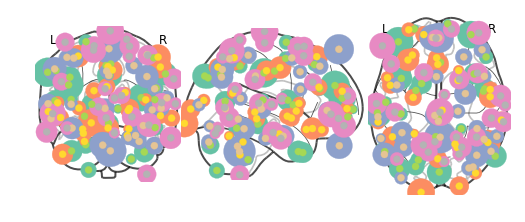

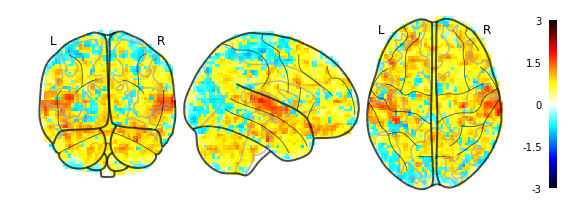

01/30/2020 10:28:55 Reconstruction Error (Frobenius Norm): 7.84962769e+01 out of 8.26601074e+02


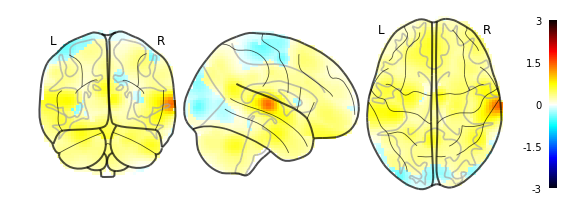

01/30/2020 10:28:58 Reconstruction Error (Frobenius Norm): 7.84962769e+01 out of 8.26601074e+02


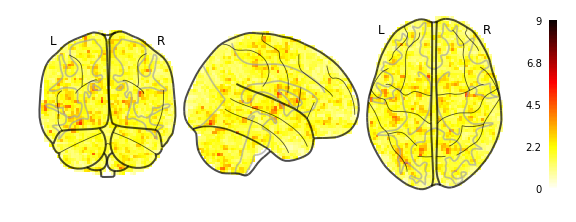

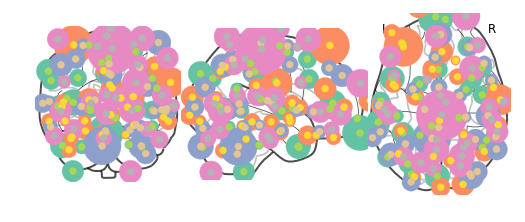

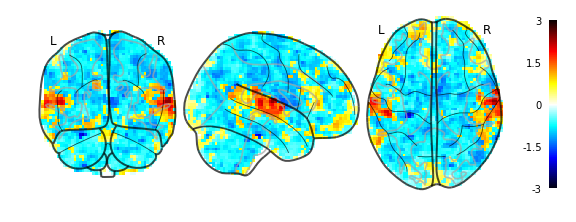

01/30/2020 10:29:04 Reconstruction Error (Frobenius Norm): 7.75268478e+01 out of 7.37839233e+02


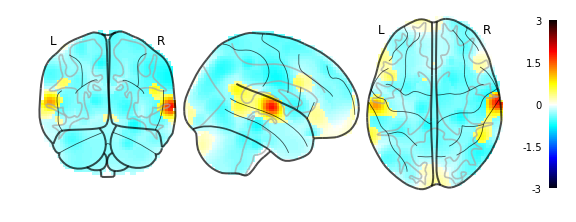

01/30/2020 10:29:06 Reconstruction Error (Frobenius Norm): 7.75268478e+01 out of 7.37839233e+02


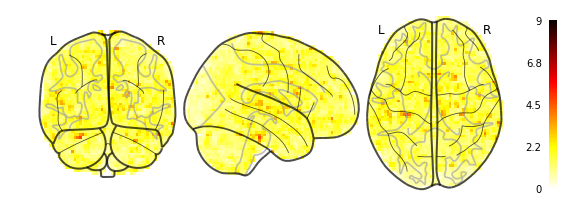

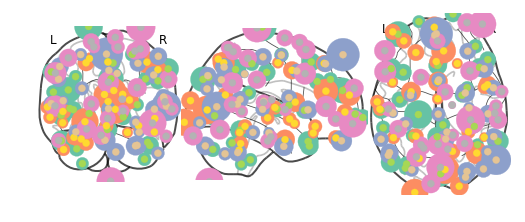

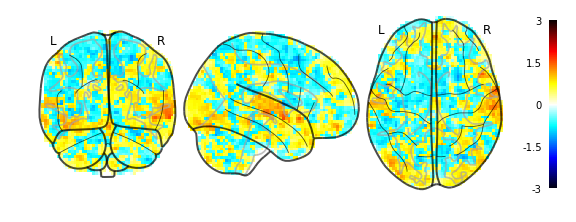

01/30/2020 10:29:12 Reconstruction Error (Frobenius Norm): 7.21223831e+01 out of 8.19254395e+02


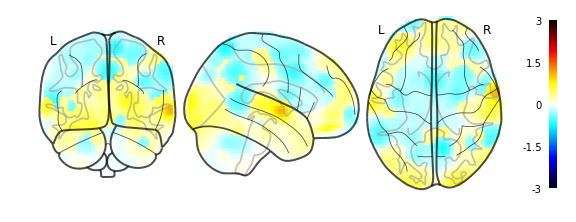

01/30/2020 10:29:15 Reconstruction Error (Frobenius Norm): 7.21223831e+01 out of 8.19254395e+02


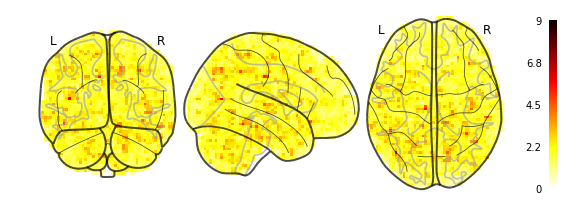

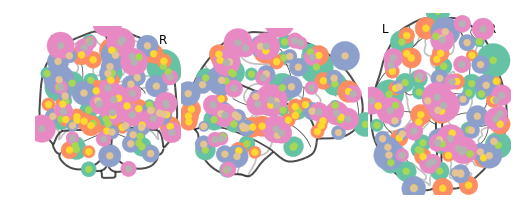

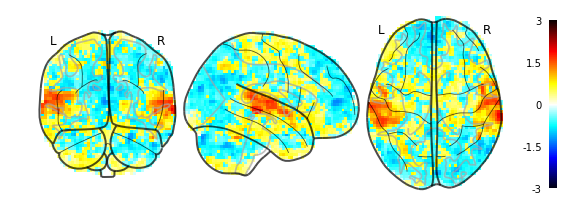

01/30/2020 10:29:21 Reconstruction Error (Frobenius Norm): 6.69866028e+01 out of 7.74554993e+02


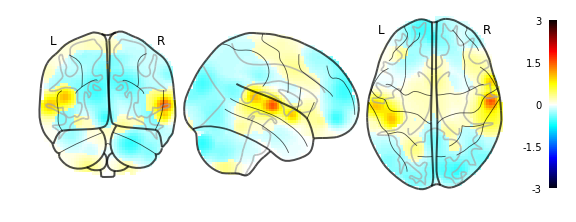

01/30/2020 10:29:23 Reconstruction Error (Frobenius Norm): 6.69866028e+01 out of 7.74554993e+02


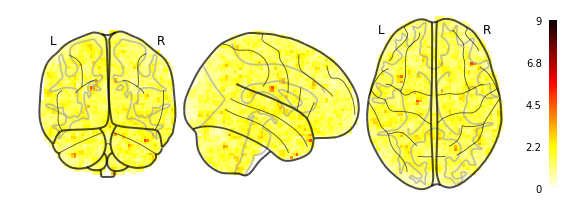

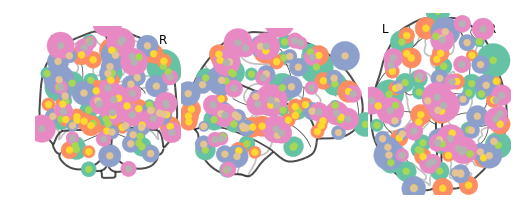

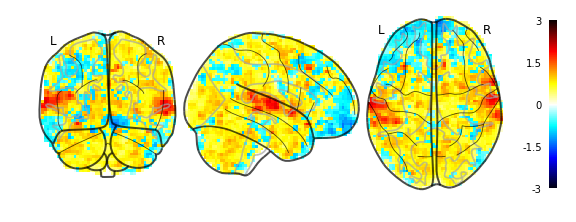

01/30/2020 10:29:30 Reconstruction Error (Frobenius Norm): 7.43345947e+01 out of 7.60746643e+02


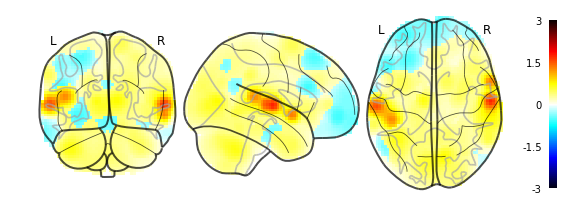

01/30/2020 10:29:32 Reconstruction Error (Frobenius Norm): 7.43345947e+01 out of 7.60746643e+02


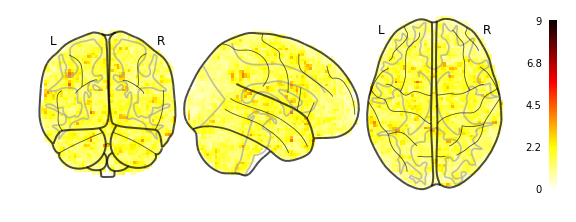

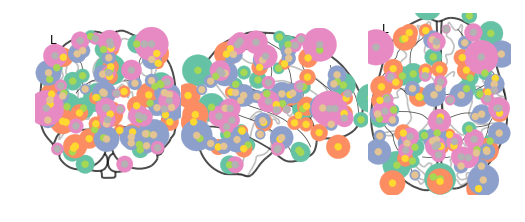

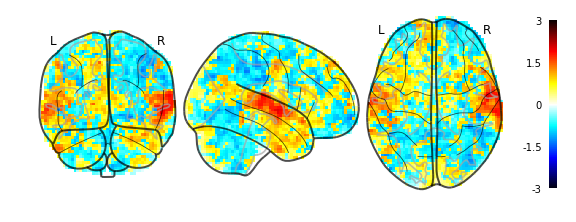

01/30/2020 10:29:38 Reconstruction Error (Frobenius Norm): 7.97287750e+01 out of 8.76528687e+02


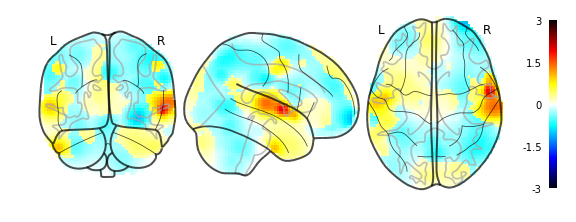

01/30/2020 10:29:41 Reconstruction Error (Frobenius Norm): 7.97287750e+01 out of 8.76528687e+02


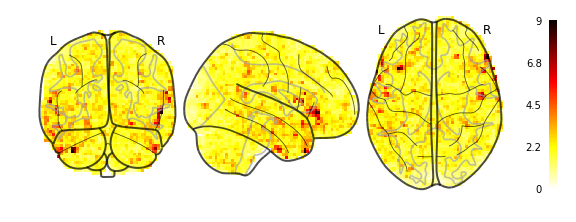

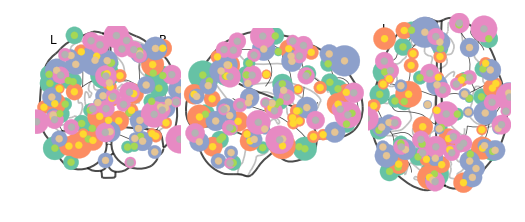

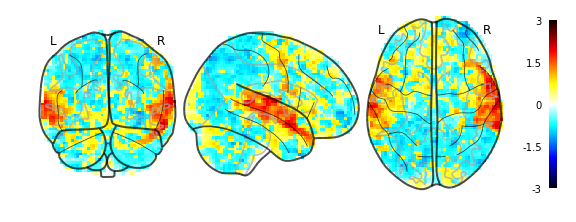

01/30/2020 10:29:47 Reconstruction Error (Frobenius Norm): 7.16579056e+01 out of 8.26226501e+02


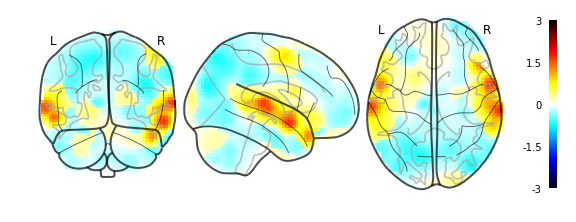

01/30/2020 10:29:49 Reconstruction Error (Frobenius Norm): 7.16579056e+01 out of 8.26226501e+02


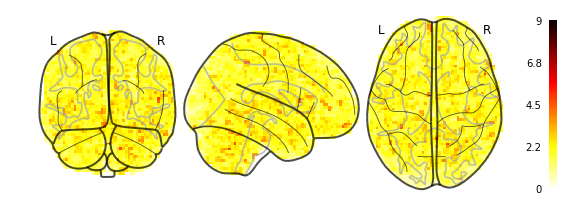

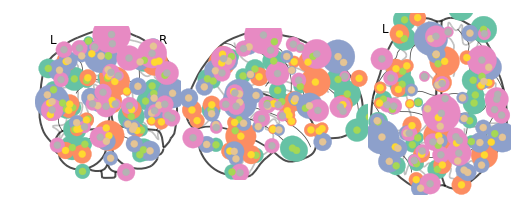

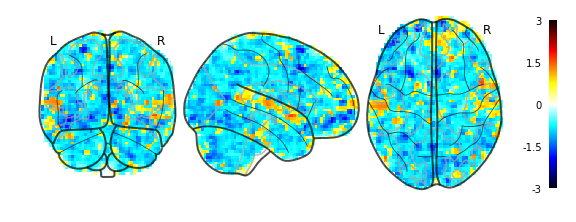

01/30/2020 10:29:55 Reconstruction Error (Frobenius Norm): 8.53582458e+01 out of 8.01213379e+02


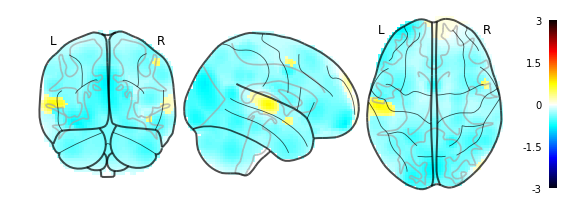

01/30/2020 10:29:58 Reconstruction Error (Frobenius Norm): 8.53582458e+01 out of 8.01213379e+02


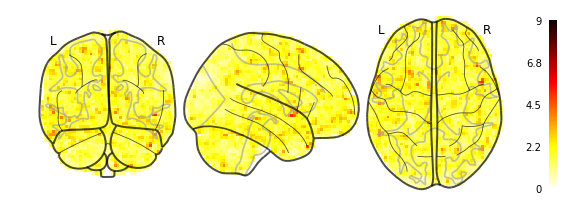

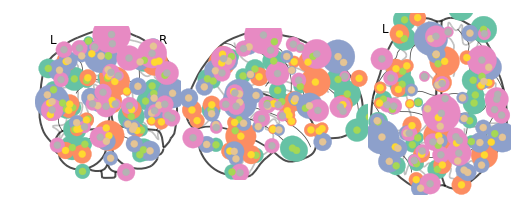

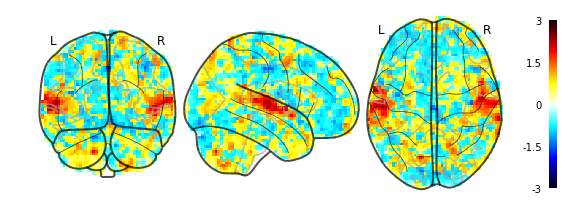

01/30/2020 10:30:04 Reconstruction Error (Frobenius Norm): 8.44230881e+01 out of 8.15328674e+02


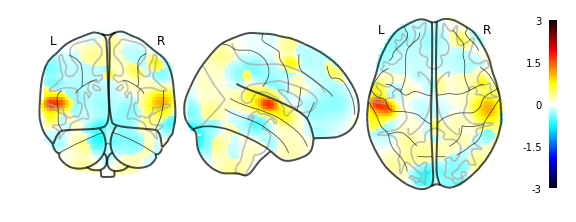

01/30/2020 10:30:06 Reconstruction Error (Frobenius Norm): 8.44230881e+01 out of 8.15328674e+02


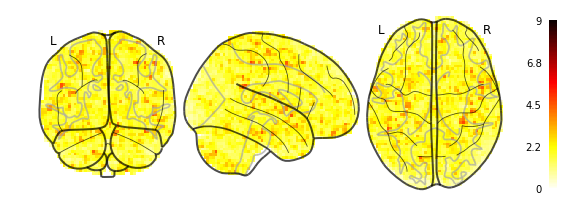

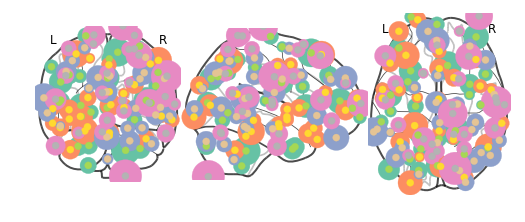

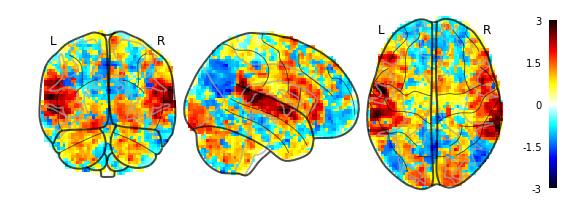

01/30/2020 10:30:12 Reconstruction Error (Frobenius Norm): 1.04408455e+02 out of 8.85320007e+02


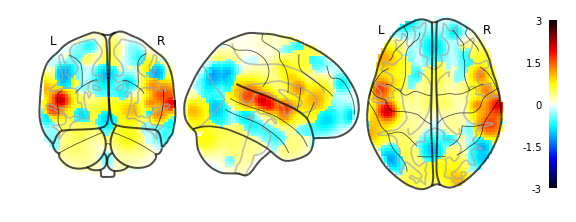

01/30/2020 10:30:14 Reconstruction Error (Frobenius Norm): 1.04408455e+02 out of 8.85320007e+02


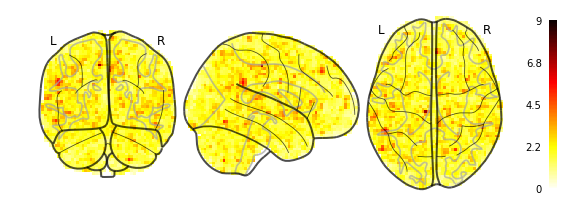

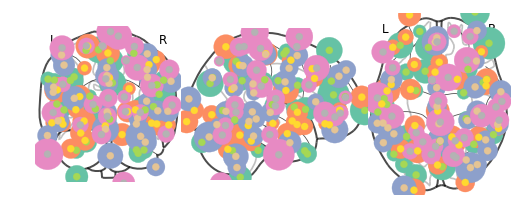

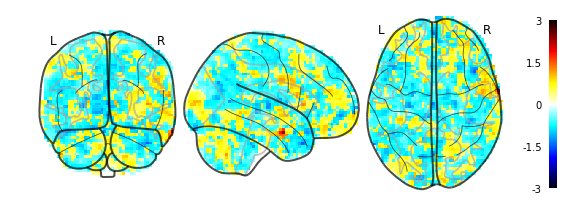

01/30/2020 10:30:20 Reconstruction Error (Frobenius Norm): 7.07832870e+01 out of 8.07556641e+02


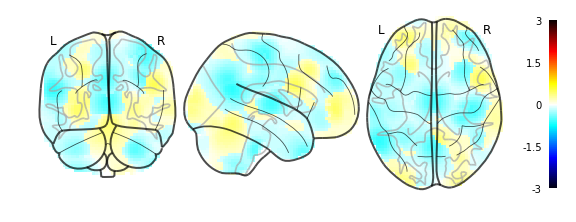

01/30/2020 10:30:22 Reconstruction Error (Frobenius Norm): 7.07832870e+01 out of 8.07556641e+02


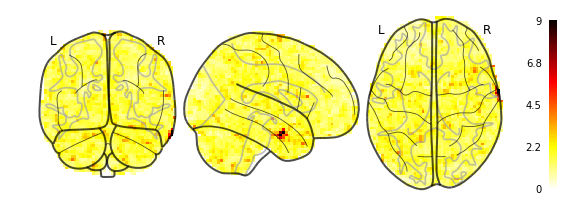

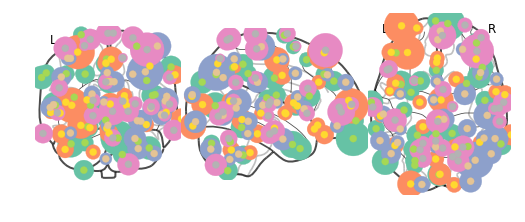

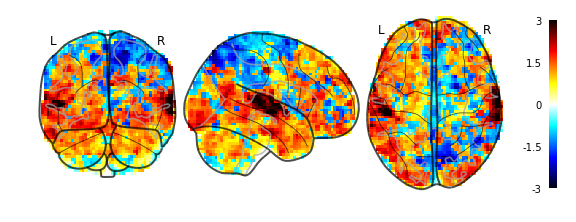

01/30/2020 10:30:28 Reconstruction Error (Frobenius Norm): 1.16790474e+02 out of 9.44142639e+02


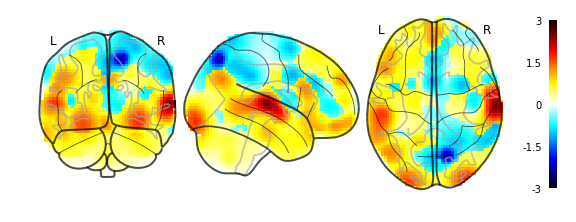

01/30/2020 10:30:30 Reconstruction Error (Frobenius Norm): 1.16790474e+02 out of 9.44142639e+02


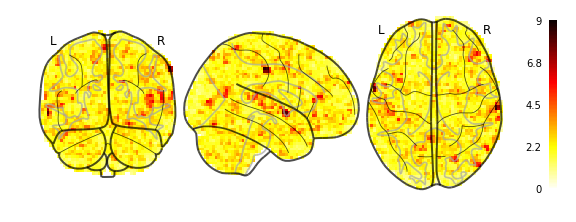

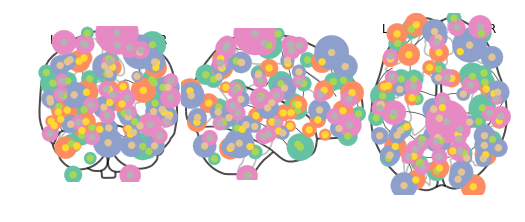

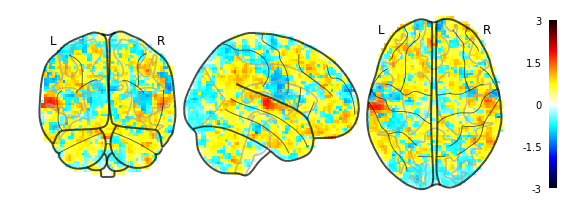

01/30/2020 10:30:36 Reconstruction Error (Frobenius Norm): 7.39209442e+01 out of 7.71454102e+02


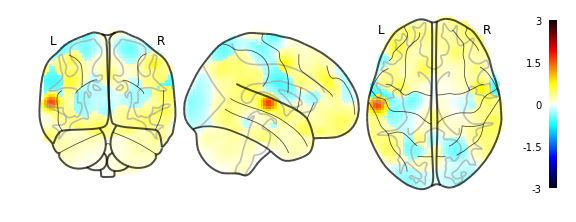

01/30/2020 10:30:39 Reconstruction Error (Frobenius Norm): 7.39209442e+01 out of 7.71454102e+02


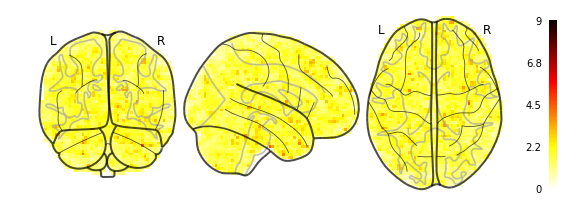

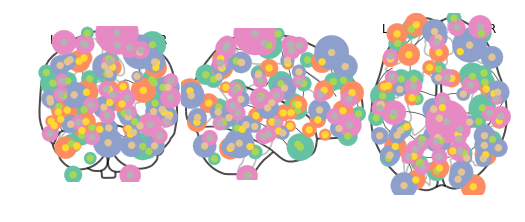

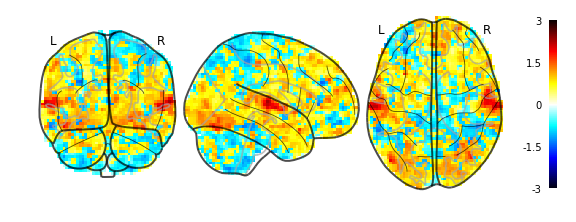

01/30/2020 10:30:44 Reconstruction Error (Frobenius Norm): 8.47498550e+01 out of 7.66293152e+02


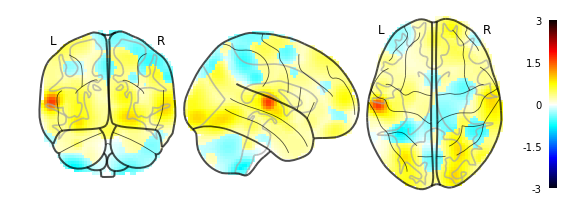

01/30/2020 10:30:47 Reconstruction Error (Frobenius Norm): 8.47498550e+01 out of 7.66293152e+02


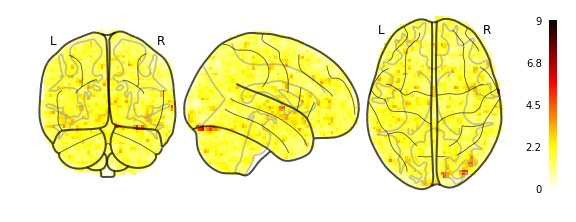

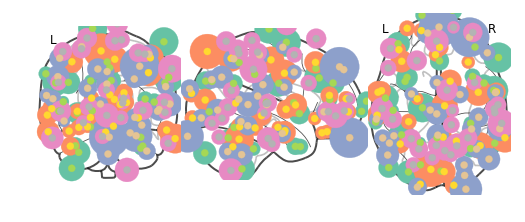

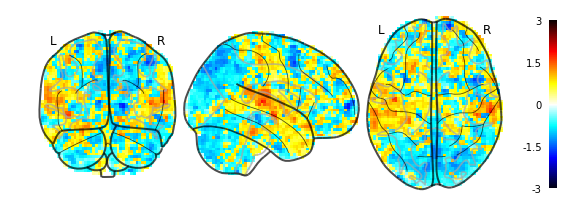

01/30/2020 10:30:53 Reconstruction Error (Frobenius Norm): 8.53799820e+01 out of 8.16404053e+02


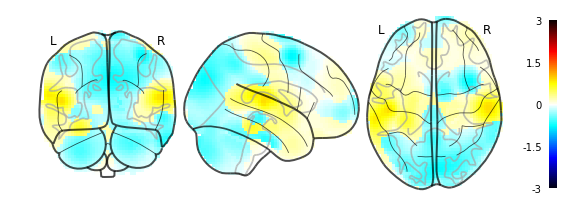

01/30/2020 10:30:55 Reconstruction Error (Frobenius Norm): 8.53799820e+01 out of 8.16404053e+02


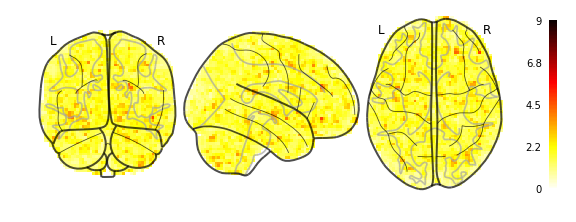

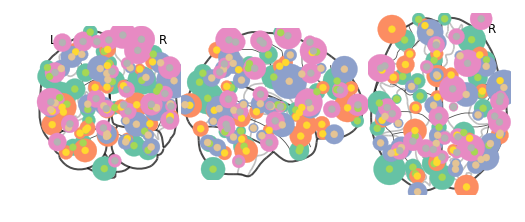

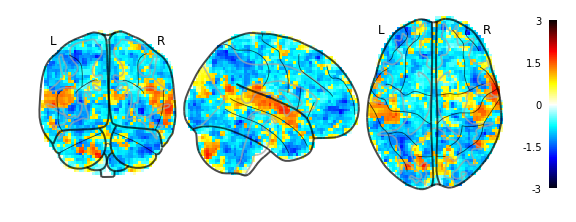

01/30/2020 10:31:01 Reconstruction Error (Frobenius Norm): 9.14078217e+01 out of 8.74308716e+02


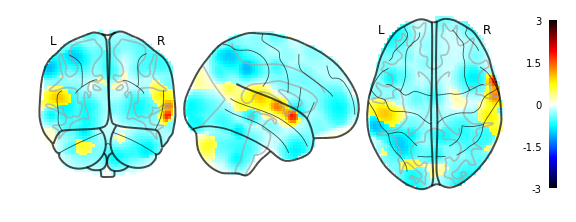

01/30/2020 10:31:03 Reconstruction Error (Frobenius Norm): 9.14078217e+01 out of 8.74308716e+02


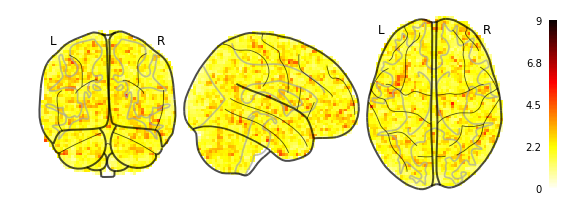

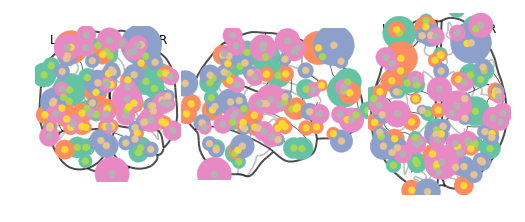

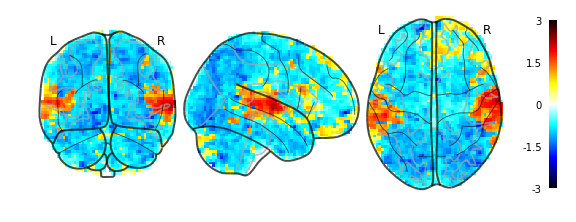

01/30/2020 10:31:09 Reconstruction Error (Frobenius Norm): 8.16972961e+01 out of 7.69490906e+02


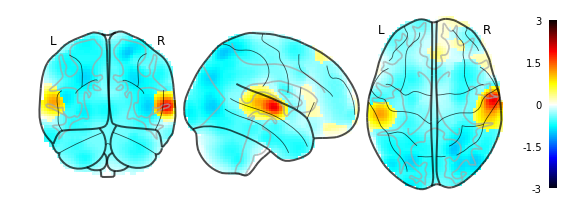

01/30/2020 10:31:11 Reconstruction Error (Frobenius Norm): 8.16972961e+01 out of 7.69490906e+02


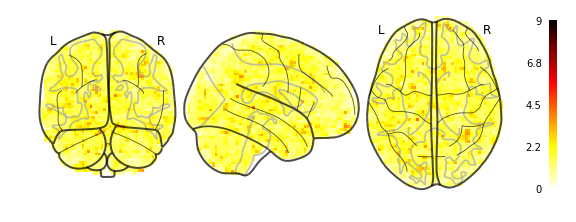

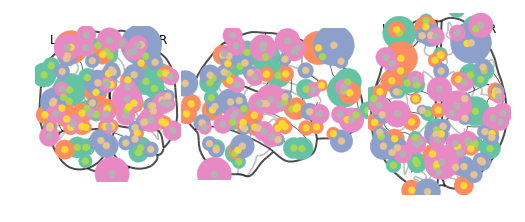

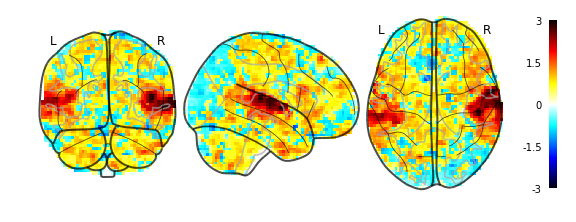

01/30/2020 10:31:17 Reconstruction Error (Frobenius Norm): 8.50618973e+01 out of 8.00959351e+02


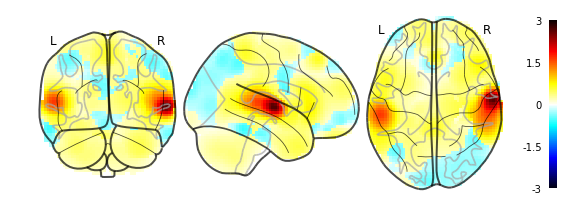

01/30/2020 10:31:20 Reconstruction Error (Frobenius Norm): 8.50618973e+01 out of 8.00959351e+02


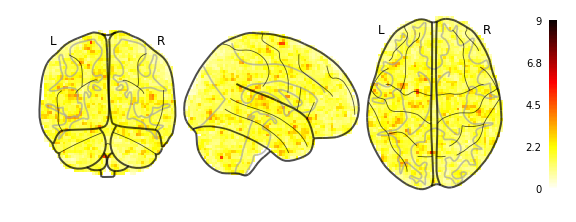

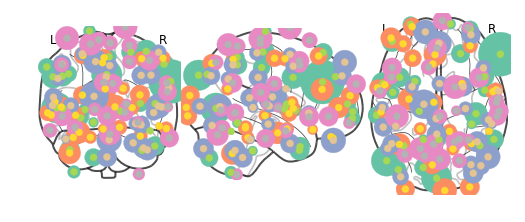

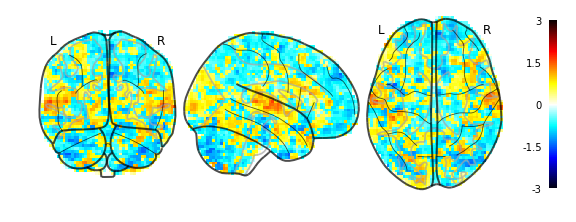

01/30/2020 10:31:26 Reconstruction Error (Frobenius Norm): 8.18856812e+01 out of 8.11815735e+02


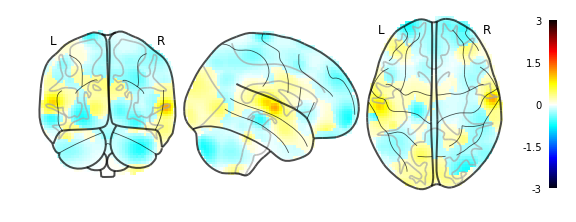

01/30/2020 10:31:29 Reconstruction Error (Frobenius Norm): 8.18856812e+01 out of 8.11815735e+02


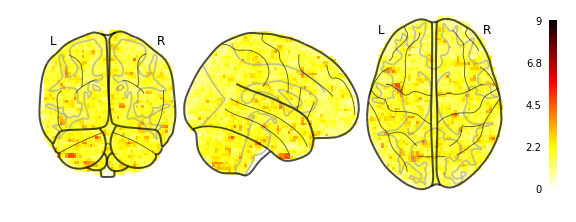

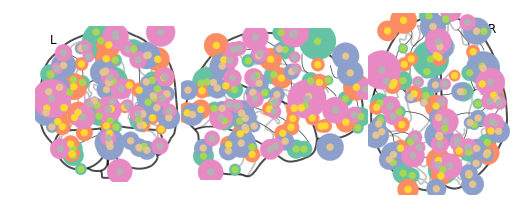

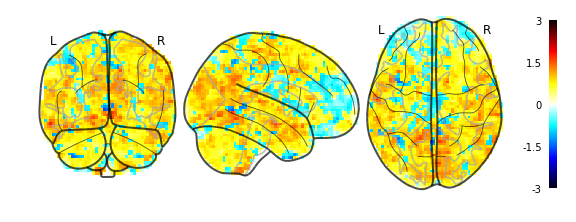

01/30/2020 10:31:35 Reconstruction Error (Frobenius Norm): 7.84386520e+01 out of 8.25840393e+02


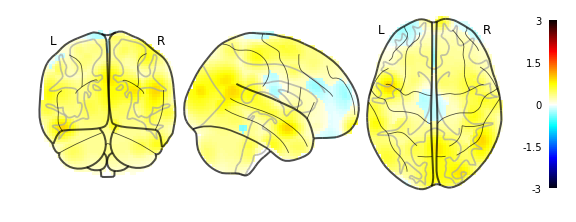

01/30/2020 10:31:37 Reconstruction Error (Frobenius Norm): 7.84386520e+01 out of 8.25840393e+02


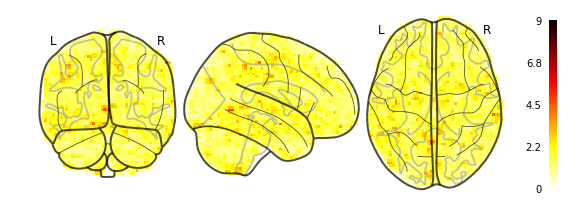

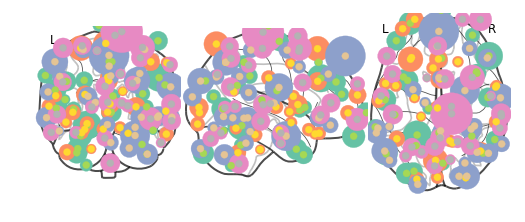

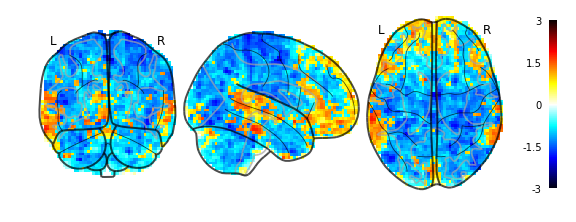

01/30/2020 10:31:43 Reconstruction Error (Frobenius Norm): 9.84801636e+01 out of 8.54286011e+02


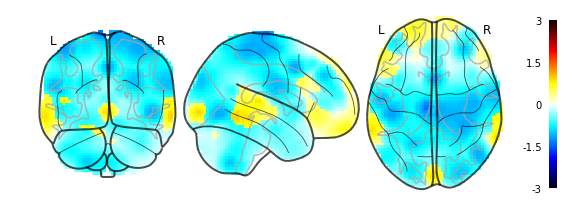

01/30/2020 10:31:46 Reconstruction Error (Frobenius Norm): 9.84801636e+01 out of 8.54286011e+02


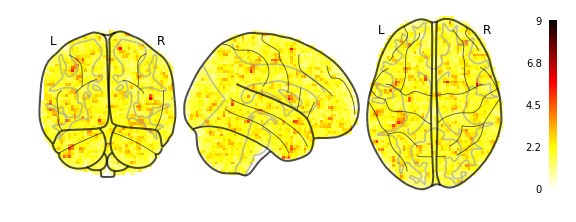

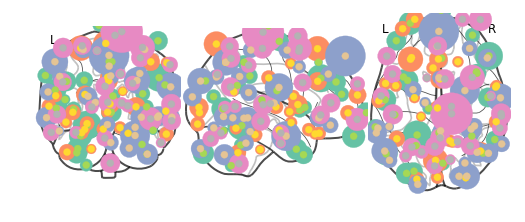

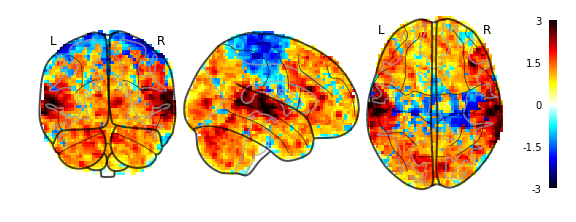

01/30/2020 10:31:52 Reconstruction Error (Frobenius Norm): 1.11965042e+02 out of 9.37374146e+02


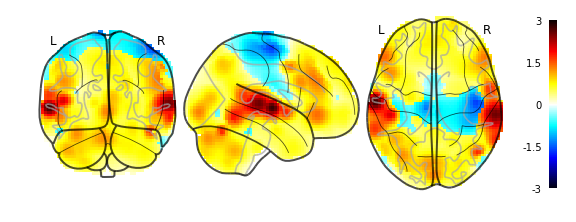

01/30/2020 10:31:54 Reconstruction Error (Frobenius Norm): 1.11965042e+02 out of 9.37374146e+02


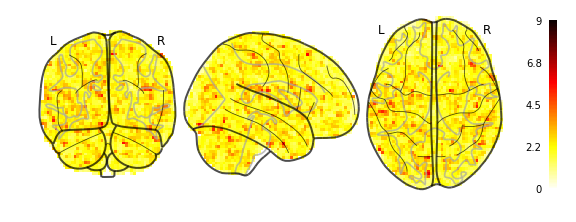

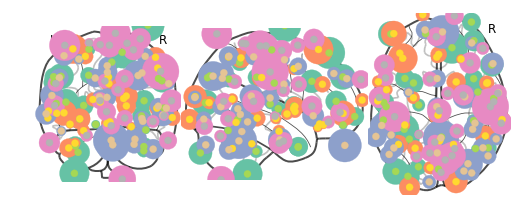

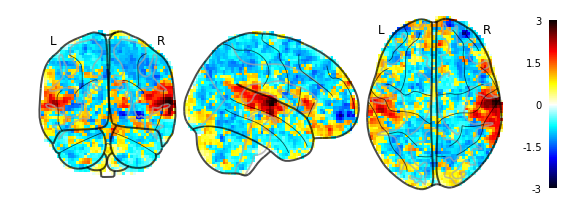

01/30/2020 10:32:00 Reconstruction Error (Frobenius Norm): 9.46197128e+01 out of 8.00525208e+02


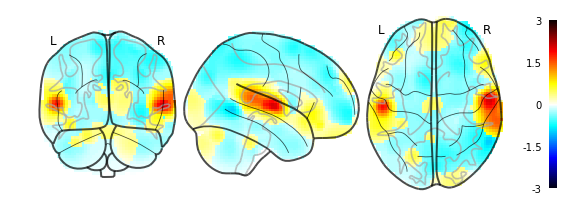

01/30/2020 10:32:02 Reconstruction Error (Frobenius Norm): 9.46197128e+01 out of 8.00525208e+02


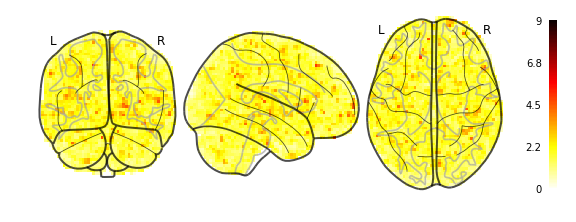

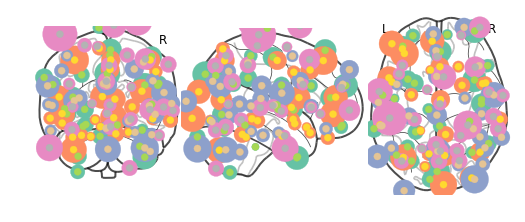

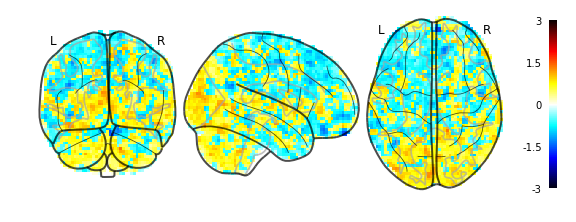

01/30/2020 10:32:08 Reconstruction Error (Frobenius Norm): 7.49116364e+01 out of 8.57255310e+02


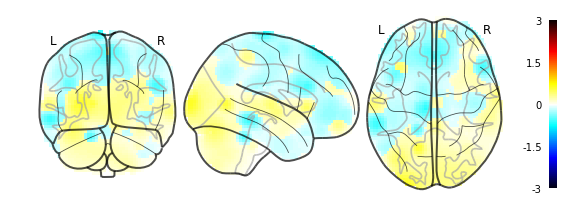

01/30/2020 10:32:10 Reconstruction Error (Frobenius Norm): 7.49116364e+01 out of 8.57255310e+02


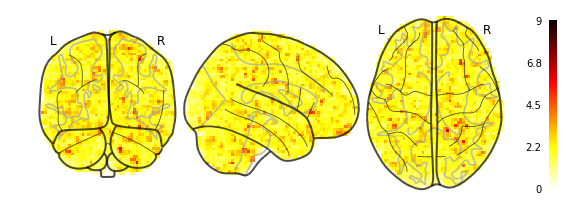

In [14]:
for index in validation_blocks[0:-1:3]:
    dtfa.plot_factor_centers(index)
    dtfa.plot_original_brain(index, labeler=lambda b: None, t=None)
    dtfa.plot_reconstruction(index, labeler=lambda b: None, t=None)
    dtfa.plot_reconstruction_diff(index, labeler=lambda b: None, t=None)

/home/zulqarnain/.conda/envs/htfatorch/lib/python3.6/site-packages/matplotlib/figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


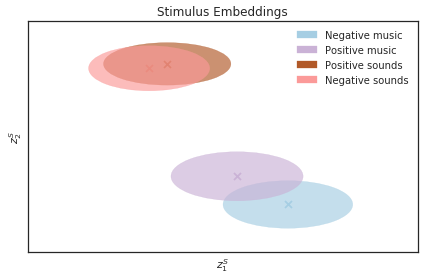

In [15]:
dtfa.scatter_task_embedding(labeler=task_labeler, colormap='Paired', figsize=None,
                            filename='lepping_2017_noresponse-task_embedding.pdf',
                            legend_ordering=[0, 2, 3, 1])

In [ ]:
# dtfa.scatter_subject_embedding(labeler=subject_labeler, figsize=None, colormap='tab20')

In [20]:
dtfa.average_reconstruction_error()

01/30/2020 10:48:08 Average reconstruction error (MSE): 8.92310890e-01
01/30/2020 10:48:08 Average data norm (Euclidean): 1.05002988e+00
01/30/2020 10:48:08 Percent average reconstruction error: 0.343150


(0.892310889700916, 1.0500298764706433, 0.0034314983188962127)

In [21]:
dtfa.average_reconstruction_error(weighted=False)

01/30/2020 10:49:14 Average reconstruction error (MSE): 7.05145005e+02 +/- 4.75648448e+01
01/30/2020 10:49:14 Average data norm (Euclidean): 8.29830952e+02 +/- 5.52383571e+01
01/30/2020 10:49:14 Percent average reconstruction error: 85.097411 +/- 4.71859711e+00


(array([740.41558838, 715.13702393, 652.51483154, 732.80157471,
        682.76599121, 696.10809326, 728.07446289, 708.99200439,
        632.1071167 , 628.03161621, 642.77752686, 633.02307129,
        671.1953125 , 724.0022583 , 692.5723877 , 680.10754395,
        661.06085205, 687.91845703, 673.25982666, 687.47357178,
        736.61810303, 745.62756348, 752.23455811, 747.18737793,
        707.23522949, 721.44213867, 715.84039307, 702.24694824,
        683.06762695, 756.93566895, 712.67602539, 735.13977051,
        680.05053711, 692.30780029, 687.05615234, 680.32940674,
        639.56848145, 638.05297852, 644.39813232, 605.07110596,
        717.41772461, 659.04333496, 707.22943115, 721.32983398,
        702.79571533, 717.40509033, 711.26959229, 740.55688477,
        735.18572998, 729.33105469, 733.50616455, 712.04724121,
        750.96142578, 758.98638916, 766.93341064, 778.20202637,
        749.7243042 , 757.86688232, 759.04968262, 736.98657227,
        712.30010986, 745.55767822, 688.

In [22]:
def condition_labeler(subject):
    subject_regex = re.compile("([A-Za-z]+)([0-9]{1,2})")
    m = subject_regex.search(subject)
    condition, sub_num = m.groups()
    if condition == 'mdd':
        return 'Major Depressive'
    elif condition == 'control':
        return 'Control'
    return condition

/home/zulqarnain/.conda/envs/htfatorch/lib/python3.6/site-packages/matplotlib/figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


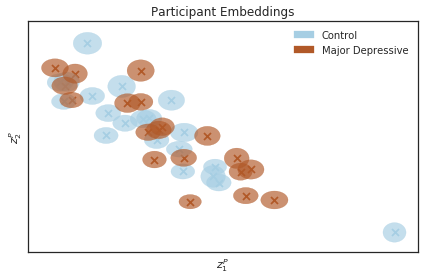

In [19]:
dtfa.scatter_subject_embedding(labeler=condition_labeler, colormap='Paired', figsize=None,
                               #xlims=(-6, 4), ylims=(2.5, 5),
                               filename='lepping_2017_noresponse-subject_embedding.pdf')

In [25]:
dtfa.free_energy(batch_size=50, use_cuda=True, blocks_batch_size=15, num_particles=1, sample_size=100,
                 blocks_filter=lepping_db.inference_filter(training=True))

[[438908288.0, -437157632.0, 1750615.5],
 [438929856.0, -437142368.0, 1752056.375]]

In [26]:
dtfa.free_energy(batch_size=50, use_cuda=True, blocks_batch_size=15, num_particles=1, sample_size=100,
                 blocks_filter=lepping_db.inference_filter(training=False))

[[85527224.0, -85210800.0, 316427.1875],
 [85540416.0, -85201840.0, 317237.34375]]